# %% [markdown]
# # Small (Infinitesimal) vs Green–Lagrange Strain — Didactic Notebook
# *Short, step-by-step cells; images + text; minimal deps (NumPy + Matplotlib).*



In [14]:
# %% 
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
from IPython.display import Image, display

# Style similar to your Euler–Bernoulli notebook
plt.rcParams.update({
    "axes.titlesize": 18,
    "axes.labelsize": 14,
    "xtick.labelsize": 12,
    "ytick.labelsize": 12,
    "legend.fontsize": 12,
})


def show_side_by_side(names, width=360, captions=None, gap=16):
    """
    Quick side-by-side display using Matplotlib to keep layout tidy.
    names: list of filenames inside FIG_DIR
    """
    fig, axs = plt.subplots(1, len(names), figsize=(len(names)*width/100, width/200*1.1), constrained_layout=True)
    if len(names) == 1:
        axs = [axs]
    for i,(ax,f) in enumerate(zip(axs, names)):
        img = plt.imread(FIG_DIR / f)
        ax.imshow(img)
        ax.axis("off")
        if captions and i < len(captions):
            ax.set_title(captions[i])
    plt.show()

def show_img(path, width=720, caption=None):
    """Display an image from a relative or absolute path with an optional caption."""
    display(Image(filename=path, width=width))
    if caption:
        print(caption)



## 1) Kinematics Overview

- Reference/material point: $\mathbf{X}$
- Current/spatial point: $\mathbf{x}(\mathbf{X}) = \mathbf{X} + \mathbf{u}(\mathbf{X})$
- Deformation gradient:
  $$
    \mathbf{F} \;=\; \frac{\partial \mathbf{x}}{\partial \mathbf{X}}
    \;=\; \frac{\partial(\mathbf{X} + \mathbf{u}(\mathbf{X}))}{\partial \mathbf{X}}
    \;=\; \mathbf{I} + \nabla\mathbf{u}
  $$



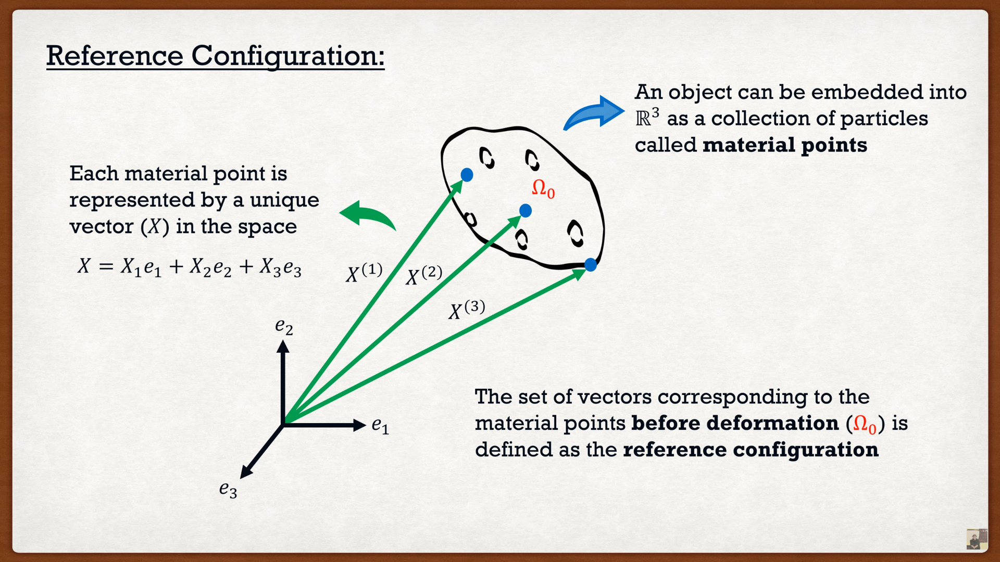

Figure 1. Kinematics: reference vs current configuration.


In [15]:
# %% 
# Cell 1 — show Figure 1
show_img("Small_Green_Strain_Tensors_Figures/1_.png",
         width=720,
         caption="Figure 1. Kinematics: reference vs current configuration.")


## 2) Strain Measures — Definitions

- Small (infinitesimal) strain:
  $$
    \boldsymbol{\varepsilon}
    \;=\;
    \tfrac{1}{2}\bigl(\nabla\mathbf{u} + (\nabla\mathbf{u})^{\!\top}\bigr)
  $$
- Green–Lagrange strain:
  $$
    \mathbf{E}
    \;=\;
    \tfrac{1}{2}\!\left(\mathbf{F}^{\top}\mathbf{F} - \mathbf{I}\right)
    \;=\;
    \boldsymbol{\varepsilon} + \tfrac{1}{2}\,(\nabla\mathbf{u})^{\!\top}\nabla\mathbf{u},
    \qquad \text{with } \mathbf{F} = \mathbf{I} + \nabla\mathbf{u}.
  $$
- **Key point:** $\mathbf{E}$ is exact (finite strains/rotations).  
  $\boldsymbol{\varepsilon}$ is the linearization, valid when $\lVert \nabla\mathbf{u} \rVert \ll 1$.


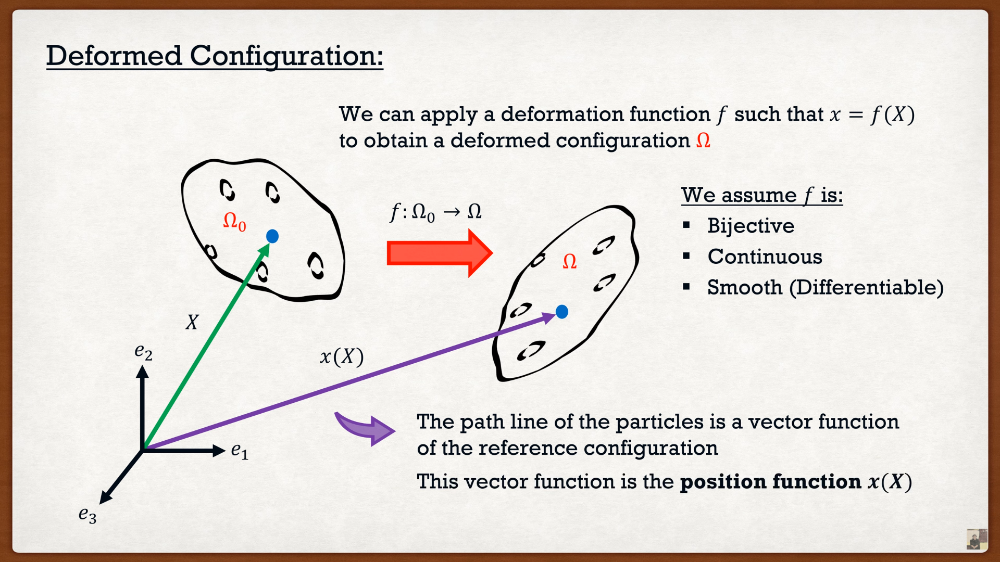

Figure 2. Strain measures side-by-side: $\,\boldsymbol{\varepsilon}$ vs $\mathbf{E}$.


In [16]:
# %%
# Cell 2 — show Figure 2
show_img("Small_Green_Strain_Tensors_Figures/2_.png",
         width=720,
         caption="Figure 2. Strain measures side-by-side: $\\,\\boldsymbol{\\varepsilon}$ vs $\\mathbf{E}$.")


## 3) Why Two Measures? Intuition & Regimes

- For **small strains/rotations**: $\mathbf{E} \approx \boldsymbol{\varepsilon}$ (quadratic term negligible).
- For a **pure rigid rotation** $\mathbf{R}$ ($\mathbf{R}^{\top}\mathbf{R}=\mathbf{I}$):  
  $$
    \mathbf{E} = \tfrac{1}{2}(\mathbf{R}^{\top}\mathbf{R}-\mathbf{I}) = \mathbf{0}
    \quad\text{but}\quad
    \boldsymbol{\varepsilon} = \tfrac{1}{2}\bigl(\mathbf{R}-\mathbf{I} + (\mathbf{R}-\mathbf{I})^{\!\top}\bigr) \neq \mathbf{0}
  $$
  hence the small-strain tensor spuriously reports “strain” under finite rotations.
- For **finite shear/stretch**: $\mathbf{E}$ captures nonlinear effects; $\boldsymbol{\varepsilon}$ can under/over-estimate.


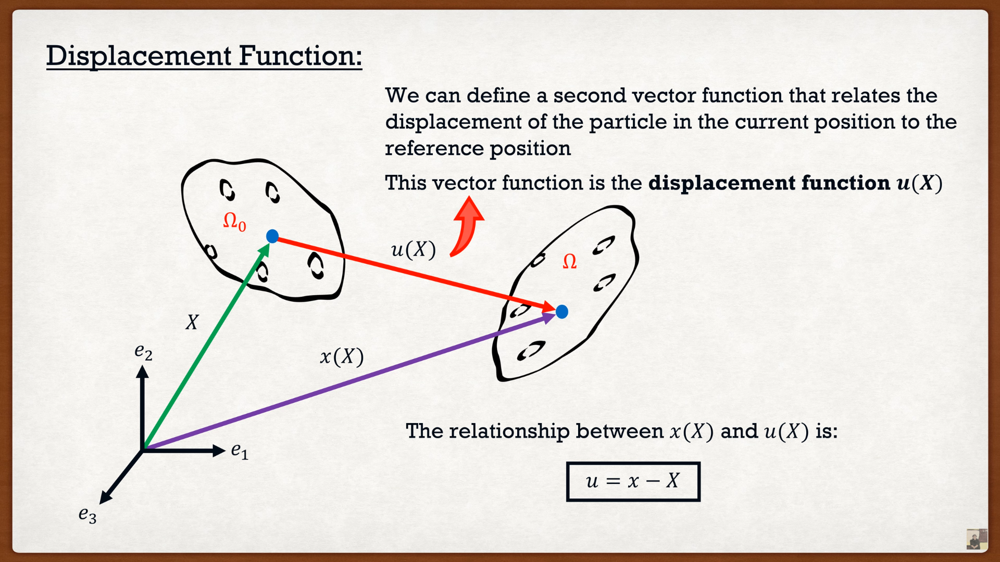

Figure 3. Validity regimes: small-strain vs finite-strain.


In [17]:
# %%
# Cell 3 — show Figure 3
show_img("Small_Green_Strain_Tensors_Figures/3_.png",
         width=720,
         caption="Figure 3. Validity regimes: small-strain vs finite-strain.")


## 4) (Your Next Concept / Diagram)

_Add the bullets and equations you want for Figure 4 here. For example, a quick linearization derivation:_
$$
  \mathbf{E}
  = \tfrac{1}{2}\bigl(\mathbf{H} + \mathbf{H}^{\!\top} + \mathbf{H}^{\!\top}\mathbf{H}\bigr),
  \quad \mathbf{H} := \nabla\mathbf{u},
  \qquad
  \boldsymbol{\varepsilon} = \tfrac{1}{2}\bigl(\mathbf{H} + \mathbf{H}^{\!\top}\bigr).
$$
_When $\lVert \mathbf{H} \rVert \ll 1$, drop $\mathbf{H}^{\!\top}\mathbf{H}$ to get $\mathbf{E}\approx \boldsymbol{\varepsilon}$. _


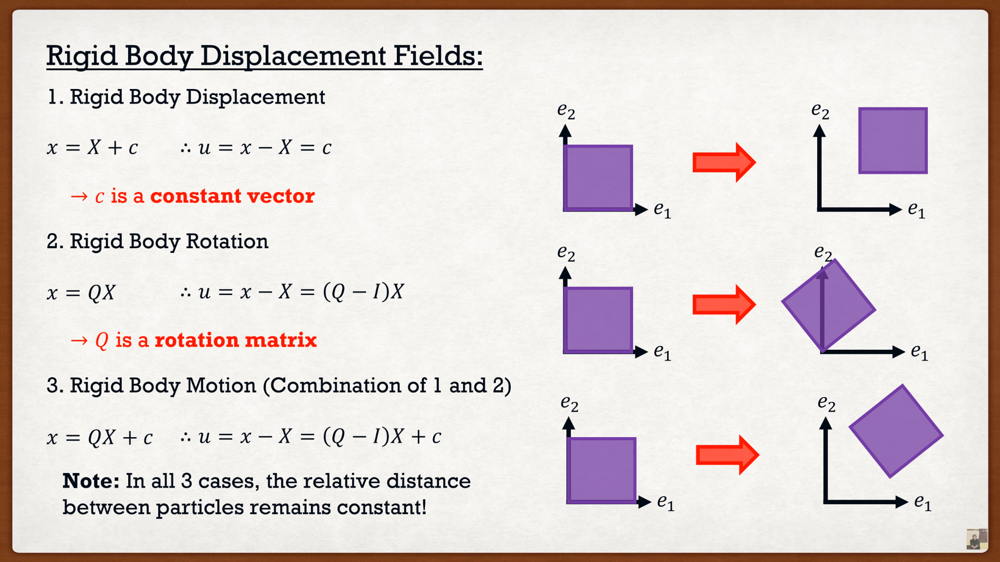

Figure 4. (Provide a short, specific caption for this diagram.)


In [18]:
# %%
# Cell 4 — show Figure 4
show_img("Small_Green_Strain_Tensors_Figures/4_.png",
         width=720,
         caption="Figure 4. (Provide a short, specific caption for this diagram.)")


## 5) Uniform Extension and Contraction

- Motion characterized by three positive parameters $(k_1, k_2, k_3)$:
$$
\mathbf{x} =
\begin{bmatrix}
x_1 \\ x_2 \\ x_3
\end{bmatrix}
=
\begin{bmatrix}
k_1 & 0 & 0 \\
0 & k_2 & 0 \\
0 & 0 & k_3
\end{bmatrix}
\begin{bmatrix}
X_1 \\ X_2 \\ X_3
\end{bmatrix},
\qquad
\mathbf{u} = \mathbf{x}-\mathbf{X} =
\begin{bmatrix}
(k_1-1)X_1 \\ (k_2-1)X_2 \\ (k_3-1)X_3
\end{bmatrix}.
$$

- Three scenarios:  
  1. **Contraction** $(0 < k < 1)$  
  2. **Expansion** $(k > 1)$  
  3. **No change** $(k=1)$  
- Note: if $k \leq 0$, motion is not physically admissible (inversion).


In [ ]:
# %%
show_img("Small_Green_Strain_Tensors_Figures/5_.png",
         width=720,
         caption="Figure 5. Uniform extension/contraction with parameters $k_1,k_2,k_3$.")
